In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from itertools import combinations
from itertools import product
from matplotlib.animation import FuncAnimation
from IPython.display import HTML



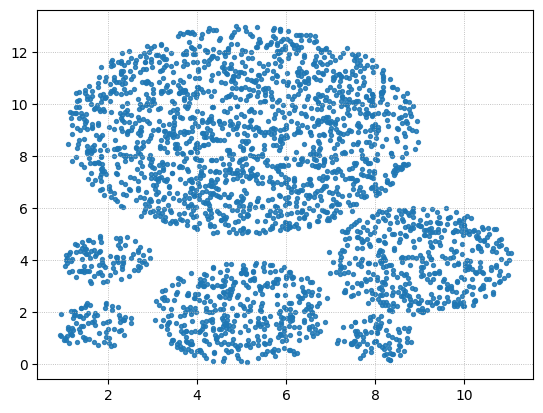

In [49]:
points_src = pd.read_csv("blobs.csv")
plt.scatter(points_src["x"],points_src["y"],s=8,alpha=0.85)
plt.grid(True, linestyle=':', linewidth=0.6)
plt.show()

In [50]:
Points = points_src[["x","y"]].to_numpy()

In [51]:
def dunn_index(M,distance_lambda):
    row,col = M.shape
    X = M[:,:col]
    cluster_ids = M[:,-1]
    unique_clusters = np.unique(cluster_ids)

    #Max Diameter of a cluster
    max_intra_dist = 0.0

    for cluster in unique_clusters:
        cluster_id_mask = (cluster_ids==cluster)
        ClusterPoints = X[cluster_id_mask]
        if len(ClusterPoints)<2:
            continue
        for p,q in combinations(ClusterPoints,2):
            dist = distance_lambda(p,q)
            if dist>max_intra_dist:
                max_intra_dist=dist

    #Min Inter-Clustre distance
    min_inter_dist = np.inf
    for cluster1,cluster2 in combinations(unique_clusters,2):
        cluster1_mask = (cluster_ids==cluster1)
        cluster2_mask = (cluster_ids==cluster2)
        Cluster1Points = X[cluster1_mask]
        Cluster2Points = X[cluster2_mask]
        for p1,p2 in product(Cluster1Points,Cluster2Points):
            dist = distance_lambda(p1,p2)
            if dist<min_inter_dist:
                min_inter_dist=dist

    if max_intra_dist==0:
        return np.inf
    
    return (min_inter_dist/max_intra_dist)
    


In [52]:
def kmeans_objective(X,Centroids,distance_lambda):
    #X = number of sample x feature dimension
    #Centroids = number of clusters x feature dimension
    row,col = X.shape
    n_centroids = Centroids.shape[0]

    #Distances = number of samples x number of clusters/centroids
    Distances = np.zeros((row,n_centroids))

    for i in range(row):
        for j in range(n_centroids):
            Distances[i][j] = distance_lambda(X[i],Centroids[j])
    
    #Assignments = number of samples x  (the index of centroid)
    AssignmentsVector = np.argmin(Distances,axis=1)

    #Distance_from_centroid - number of samples x 1 (Distance from nearest centroid)
    DistancesFromNearestCentroid = np.zeros((row,1))
    for i in range(row):
        DistancesFromNearestCentroid[i] = Distances[i][AssignmentsVector[i]]
    
    total = np.sum(DistancesFromNearestCentroid)

    return total,AssignmentsVector


    


In [53]:
def update_centroids(X,Centroids):
    # X = number of samples x (feature dimension + 1 (cluster_index column at the end))
    # Centroids = number of clusters x feature_dimension
    k, n_features = Centroids.shape
    CentroidsNew = np.zeros((k,n_features))

    for i in range(k):
        #ClusterPoints = number of filtered samples x feature dimension
        ClusterPoints = X[X[:, -1] == i, :-1]

        if ClusterPoints.shape[0] > 0:
            CentroidsNew[i] = np.mean(ClusterPoints, axis=0)
        else:
            CentroidsNew[i] = Centroids[i]

    return CentroidsNew

In [54]:
def event_loop(
    X,
    Centroids,
    distance_lambda,
    convergence_lambda,
    pre_event_lambda=None,
    post_event_lambda=None,
    max_iters=100
):
    #X = number of samples x feature dimension
    #Centroid = number of clusters x feature dimension




    CentroidsPrev = Centroids.copy()

    for iteration in range(max_iters):

        objective_value, Assignments = kmeans_objective(
            X, Centroids, distance_lambda
        )

        if pre_event_lambda is not None:
            pre_event_lambda(X, Centroids, Assignments, objective_value, iteration)

        X_aug = np.hstack((X, Assignments.reshape(-1, 1)))


        CentroidsNew = update_centroids(X_aug, Centroids)


        if post_event_lambda is not None:
            post_event_lambda(X, CentroidsNew, iteration)

        # --- Convergence check ---
        if convergence_lambda(CentroidsPrev, CentroidsNew, iteration):
            Centroids = CentroidsNew
            break

        CentroidsPrev = Centroids
        Centroids = CentroidsNew

    return Centroids, Assignments


In [55]:
distance_lambda = lambda x, c: np.sum((x - c) ** 2)

def centroid_convergence(distance_lambda,threshold=1e-3):
    def convergence_lambda(prev, new, iteration):
        k = prev.shape[0]
        movement = 0.0 
        for i in range(k):
            movement+=distance_lambda(prev[i],new[i])
        print(f"Iter {iteration}: centroid movement = {movement}")
        return movement < threshold
    return convergence_lambda


In [56]:
def history_collector():
    history = {
        "objectives": [],
        "Centroids": [],
        "Assignments":[],
        "iteration": 0
    }
    def update(X, Centroids, Assignments, objective_value, iteration):
        history["objectives"].append(objective_value)
        history["Centroids"].append(Centroids.copy())
        history["Assignments"].append(Assignments.copy())
        history["iteration"] = history["iteration"]+1

    return history,update

In [57]:
k = 12

np.random.seed()
random_index = np.random.choice(Points.shape[0], k, replace=False)
Centroids = Points[random_index]

history, update_hook = history_collector()

CentroidFinal,AssignmentsFinal = event_loop(
    X=Points,
    Centroids=Centroids,
    distance_lambda=distance_lambda,
    convergence_lambda=centroid_convergence(distance_lambda),
    pre_event_lambda=update_hook,
    post_event_lambda=None,
    max_iters=50
)

Iter 0: centroid movement = 12.572319859597254
Iter 1: centroid movement = 21.908879918169625
Iter 2: centroid movement = 4.460662878753611
Iter 3: centroid movement = 2.0864252082376105
Iter 4: centroid movement = 1.4737495764157247
Iter 5: centroid movement = 1.1250138267094778
Iter 6: centroid movement = 0.8283727178104512
Iter 7: centroid movement = 0.535474577273281
Iter 8: centroid movement = 0.31936701743796775
Iter 9: centroid movement = 0.2080271434212983
Iter 10: centroid movement = 0.12874940949609437
Iter 11: centroid movement = 0.11881423472319723
Iter 12: centroid movement = 0.19536844146603916
Iter 13: centroid movement = 0.36020550220564307
Iter 14: centroid movement = 0.5865540865114305
Iter 15: centroid movement = 0.9420656853553914
Iter 16: centroid movement = 0.9886200704526563
Iter 17: centroid movement = 0.5680512155823355
Iter 18: centroid movement = 0.2215662110299031
Iter 19: centroid movement = 0.10346077332720545
Iter 20: centroid movement = 0.093157166277197

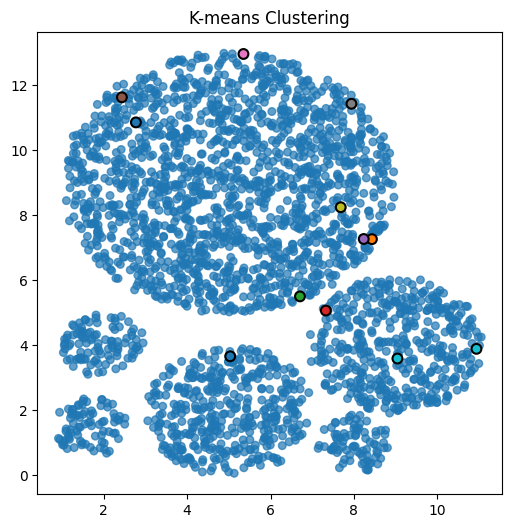

In [58]:
fig, ax = plt.subplots(figsize=(6, 6))

scatter = ax.scatter(
    Points[:, 0], Points[:, 1],
    c=np.zeros(len(Points)),
    cmap="tab10",
    s=30,
    alpha=0.7
)

centroid_scatter = ax.scatter(
    Centroids[:, 0], Centroids[:, 1],
    s=50,
    c=np.arange(k),
    cmap="tab10",
    marker="o",
    edgecolors="black",
    linewidths=1.5,
    zorder=5
)

ax.set_title("K-means Clustering")
scatter.set_clim(0, k - 1)



In [59]:
kmeans_text = fig.text(
    0.5, 0.02,                  
    "",
    ha="center",
    va="bottom",
    fontsize=11,
    bbox=dict(
        boxstyle="round,pad=0.4",
        facecolor="white",
        edgecolor="black",
        alpha=0.9
    )
)



def animate(frame):
    Assignments = history["Assignments"][frame]
    Centroids_f = history["Centroids"][frame]
    obj = history["objectives"][frame]

    scatter.set_array(Assignments)
    centroid_scatter.set_offsets(Centroids_f)

    kmeans_text.set_text(
        f"Kmeans Score = {obj:.4f}"
    )

    ax.set_title(f"Kmeans (Iteration {frame + 1})")

    return scatter, centroid_scatter, kmeans_text


anim = FuncAnimation(
    fig,
    animate,
    frames=len(history["Centroids"]),
    interval=600,
    blit=False
)

HTML(anim.to_jshtml())
